Copyright (c) Microsoft Corporation. All rights reserved. Licensed under the MIT License.

# Chain network CyberBattle Gym played by a random agent

# Gym random agent attacking a chain-like network

## Chain network
We consider a computer network of Windows and Linux machines where each machine has vulnerability 
granting access to another machine as per the following pattern:

    Start ---> (Linux ---> Windows --->  ... Linux ---> Windows)*  ---> Linux[Flag]

The network is parameterized by the length of the central Linux-Windows chain.
The start node leaks the credentials to connect to all other nodes:

For each `XXX ---> Windows` section, the XXX node has:
    -  a local vulnerability exposing the RDP password to the Windows machine
    -  a bunch of other trap vulnerabilities (high cost with no outcome)
For each `XXX ---> Linux` section,
    - the Windows node has a local vulnerability exposing the SSH password to the Linux machine
    - a bunch of other trap vulnerabilities (high cost with no outcome)

The chain is terminated by one node with a flag (reward).

## Benchmark
The following plot shows the average and one standard deviation cumulative reward over time as a random agent attacks the network.

In [1]:
%%HTML
<img src="random_plot.png" width="300">

In [2]:
import sys
import logging
import gym
from gym import spaces
import numpy as np
import networkx as nx
import cyberbattle.simulation.actions as actions
import cyberbattle._env.cyberbattle_env as cyberbattle_env
import cyberbattle.agents.random_agent as random_agent
import cyberbattle.samples.chainpattern.chainpattern as chainpattern
import importlib
importlib.reload(actions)
importlib.reload(cyberbattle_env)
importlib.reload(chainpattern)

logging.basicConfig(stream=sys.stdout, level=logging.ERROR, format="%(levelname)s: %(message)s")

In [3]:
# chainpattern.create_network_chain_link(2)

In [4]:
gym_env = gym.make('CyberBattleChain-v0', size=10, attacker_goal=None)

In [5]:
gym_env.environment

Environment(network=<networkx.classes.digraph.DiGraph object at 0x7f25bf347160>, vulnerability_library={}, identifiers=Identifiers(properties=['Windows', 'Linux', 'ApacheWebSite', 'IIS_2019', 'IIS_2020_patched', 'MySql', 'Ubuntu', 'nginx/1.10.3', 'SMB_vuln', 'SMB_vuln_patched', 'SQLServer', 'Win10', 'Win10Patched', 'FLAG:Linux'], ports=['HTTPS', 'GIT', 'SSH', 'RDP', 'PING', 'MySQL', 'SSH-key', 'su'], local_vulnerabilities=['ScanBashHistory', 'ScanExplorerRecentFiles', 'SudoAttempt', 'CrackKeepPassX', 'CrackKeepPass'], remote_vulnerabilities=['ProbeLinux', 'ProbeWindows']), creationTime=datetime.datetime(2023, 10, 13, 22, 44, 43, 155305), lastModified=datetime.datetime(2023, 10, 13, 22, 44, 43, 155306), version='0.1.0')

In [6]:
gym_env.environment.network.nodes

NodeView(('start', '11_LinuxNode', '1_LinuxNode', '2_WindowsNode', '3_LinuxNode', '4_WindowsNode', '5_LinuxNode', '6_WindowsNode', '7_LinuxNode', '8_WindowsNode', '9_LinuxNode', '10_WindowsNode'))

In [7]:
gym_env.action_space

DiscriminatedUnion(connect:MultiDiscrete([ 100  100    8 1000]), local_vulnerability:MultiDiscrete([100   5]), remote_vulnerability:MultiDiscrete([100 100   2]))

In [8]:
gym_env.action_space.sample()

OrderedDict([('remote_vulnerability', array([44, 39,  0]))])

In [9]:
gym_env.observation_space.sample()

OrderedDict([('_credential_cache',
              [CachedCredential(node='Sharepoint', port='HTTPS', credential='ADPrincipalCreds')]),
             ('_discovered_nodes', ['node1', 'node0', 'node2']),
             ('_explored_network',
              <networkx.classes.digraph.DiGraph at 0x7f25bf2e3910>),
             ('action_mask',
              OrderedDict([('connect',
                            array([[[[0, 0, 1, ..., 0, 0, 1],
                                     [1, 1, 0, ..., 0, 1, 0],
                                     [0, 1, 0, ..., 0, 1, 0],
                                     ...,
                                     [1, 1, 0, ..., 0, 0, 1],
                                     [1, 0, 1, ..., 1, 0, 0],
                                     [1, 0, 0, ..., 0, 1, 1]],
                            
                                    [[1, 1, 1, ..., 0, 1, 0],
                                     [1, 1, 0, ..., 1, 1, 0],
                                     [0, 0, 1, ..., 1, 1, 1],

In [10]:
for i in range(100) : gym_env.sample_valid_action()

+ rewarded action: {'local_vulnerability': array([0, 1], dtype=int32)} total_reward=14.0 reward=14.0 @t=3
  local_vulnerability(`start, ScanExplorerRecentFiles)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


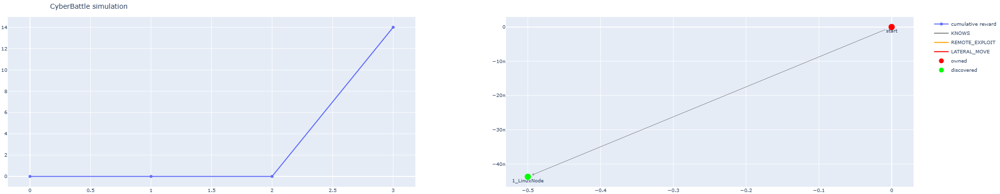

+ rewarded action: {'remote_vulnerability': array([0, 1, 0], dtype=int32)} total_reward=18.0 reward=4.0 @t=6
  remote_vulnerability(`start, `1_LinuxNode, ProbeLinux)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


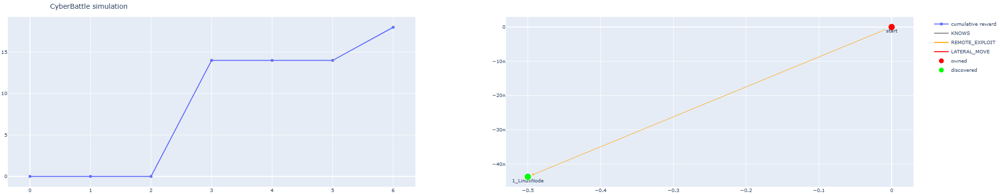

+ rewarded action: {'remote_vulnerability': array([0, 1, 1], dtype=int32)} total_reward=20.0 reward=2.0 @t=7
  remote_vulnerability(`start, `1_LinuxNode, ProbeWindows)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


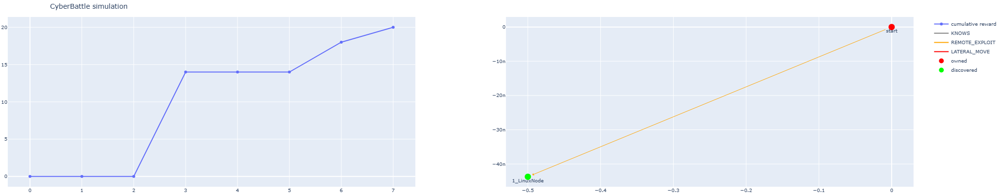

+ rewarded action: {'connect': array([0, 1, 2, 0], dtype=int32)} total_reward=120.0 reward=100.0 @t=21
  connect(`start, `1_LinuxNode, SSH, LinuxPassword!1)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"


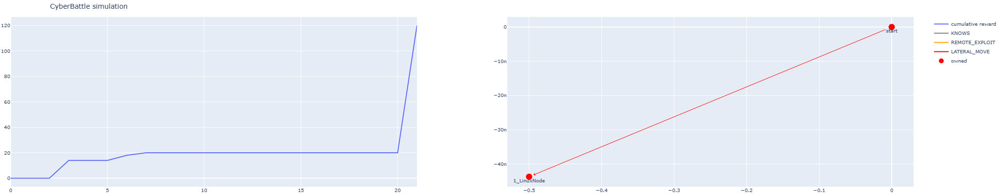

+ rewarded action: {'local_vulnerability': array([1, 3], dtype=int32)} total_reward=134.0 reward=14.0 @t=22
  local_vulnerability(`1_LinuxNode, CrackKeepPassX)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


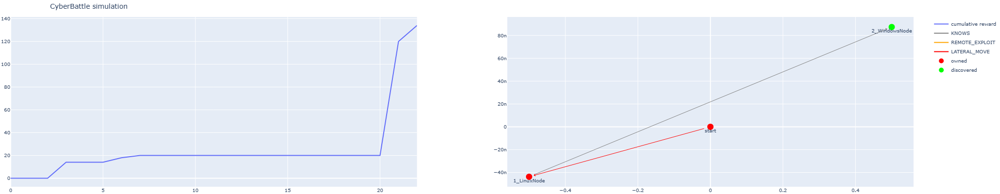

+ rewarded action: {'remote_vulnerability': array([0, 2, 1], dtype=int32)} total_reward=142.0 reward=8.0 @t=29
  remote_vulnerability(`start, `2_WindowsNode, ProbeWindows)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


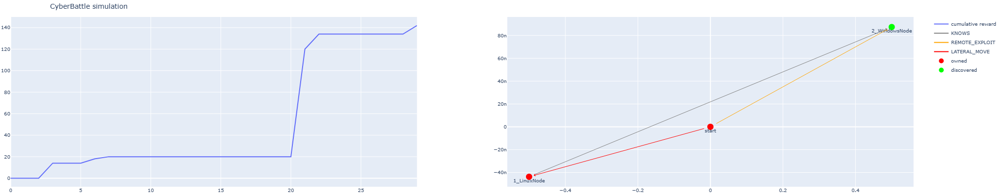

+ rewarded action: {'local_vulnerability': array([1, 0], dtype=int32)} total_reward=148.0 reward=6.0 @t=36
  local_vulnerability(`1_LinuxNode, ScanBashHistory)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


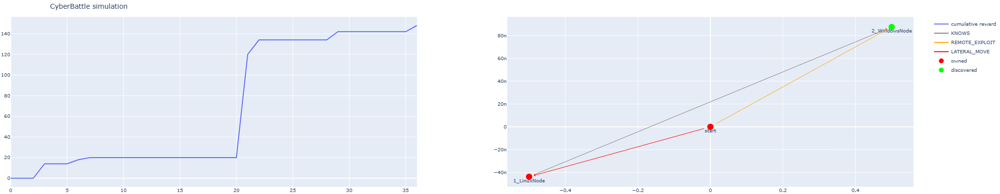

+ rewarded action: {'remote_vulnerability': array([1, 2, 0], dtype=int32)} total_reward=154.0 reward=6.0 @t=47
  remote_vulnerability(`1_LinuxNode, `2_WindowsNode, ProbeLinux)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


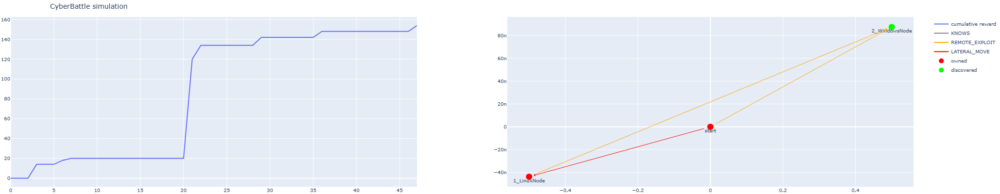

+ rewarded action: {'connect': array([0, 2, 3, 1], dtype=int32)} total_reward=254.0 reward=100.0 @t=138
  connect(`start, `2_WindowsNode, RDP, WindowsPassword!2)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"


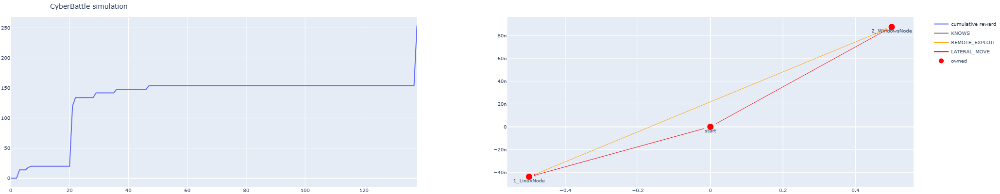

+ rewarded action: {'local_vulnerability': array([2, 4], dtype=int32)} total_reward=268.0 reward=14.0 @t=158
  local_vulnerability(`2_WindowsNode, CrackKeepPass)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


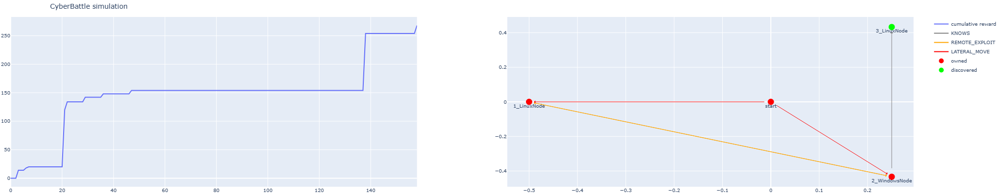

+ rewarded action: {'remote_vulnerability': array([1, 3, 1], dtype=int32)} total_reward=270.0 reward=2.0 @t=160
  remote_vulnerability(`1_LinuxNode, `3_LinuxNode, ProbeWindows)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


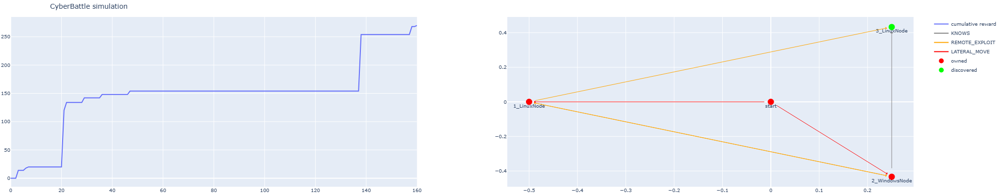

+ rewarded action: {'remote_vulnerability': array([1, 3, 0], dtype=int32)} total_reward=274.0 reward=4.0 @t=190
  remote_vulnerability(`1_LinuxNode, `3_LinuxNode, ProbeLinux)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


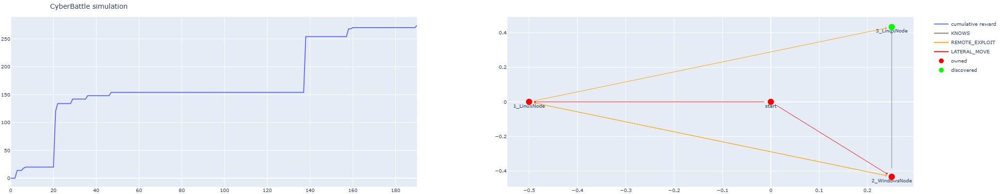

+ rewarded action: {'local_vulnerability': array([2, 1], dtype=int32)} total_reward=280.0 reward=6.0 @t=201
  local_vulnerability(`2_WindowsNode, ScanExplorerRecentFiles)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


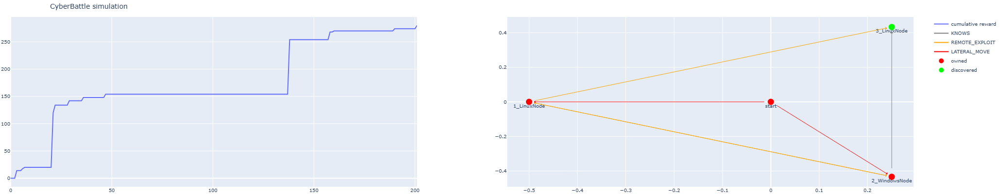

+ rewarded action: {'connect': array([2, 3, 2, 2], dtype=int32)} total_reward=380.0 reward=100.0 @t=407
  connect(`2_WindowsNode, `3_LinuxNode, SSH, LinuxPassword!3)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"


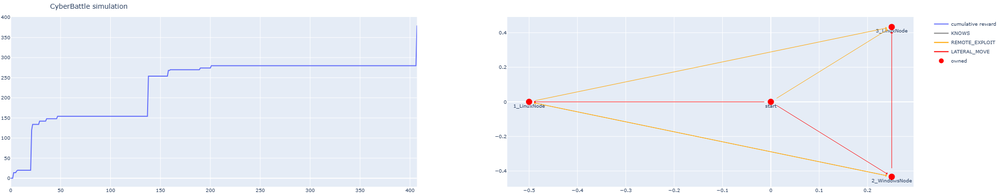

+ rewarded action: {'local_vulnerability': array([3, 0], dtype=int32)} total_reward=391.0 reward=11.0 @t=418
  local_vulnerability(`3_LinuxNode, ScanBashHistory)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


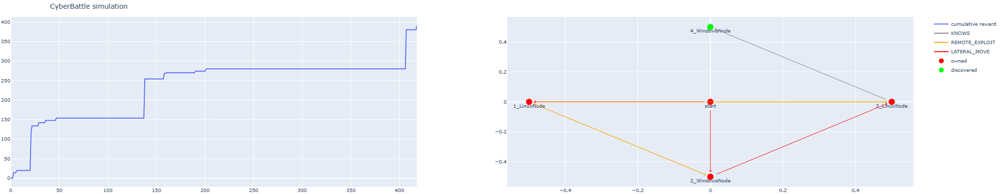

+ rewarded action: {'remote_vulnerability': array([0, 4, 0], dtype=int32)} total_reward=397.0 reward=6.0 @t=421
  remote_vulnerability(`start, `4_WindowsNode, ProbeLinux)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


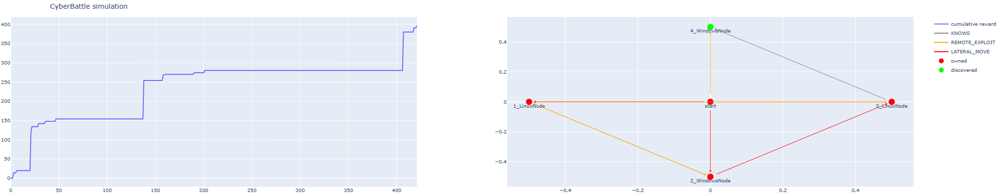

+ rewarded action: {'remote_vulnerability': array([3, 4, 1], dtype=int32)} total_reward=405.0 reward=8.0 @t=453
  remote_vulnerability(`3_LinuxNode, `4_WindowsNode, ProbeWindows)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


+ rewarded action: {'local_vulnerability': array([3, 3], dtype=int32)} total_reward=414.0 reward=9.0 @t=458
  local_vulnerability(`3_LinuxNode, CrackKeepPassX)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


+ rewarded action: {'connect': array([1, 4, 3, 3], dtype=int32)} total_reward=514.0 reward=100.0 @t=673
  connect(`1_LinuxNode, `4_WindowsNode, RDP, WindowsPassword!4)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"


+ rewarded action: {'local_vulnerability': array([4, 4], dtype=int32)} total_reward=528.0 reward=14.0 @t=702
  local_vulnerability(`4_WindowsNode, CrackKeepPass)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


+ rewarded action: {'remote_vulnerability': array([4, 5, 1], dtype=int32)} total_reward=530.0 reward=2.0 @t=734
  remote_vulnerability(`4_WindowsNode, `5_LinuxNode, ProbeWindows)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


+ rewarded action: {'local_vulnerability': array([4, 1], dtype=int32)} total_reward=536.0 reward=6.0 @t=777
  local_vulnerability(`4_WindowsNode, ScanExplorerRecentFiles)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


+ rewarded action: {'remote_vulnerability': array([2, 5, 0], dtype=int32)} total_reward=540.0 reward=4.0 @t=794
  remote_vulnerability(`2_WindowsNode, `5_LinuxNode, ProbeLinux)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


+ rewarded action: {'connect': array([2, 5, 2, 4], dtype=int32)} total_reward=640.0 reward=100.0 @t=3098
  connect(`2_WindowsNode, `5_LinuxNode, SSH, LinuxPassword!5)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"


+ rewarded action: {'local_vulnerability': array([5, 3], dtype=int32)} total_reward=654.0 reward=14.0 @t=3111
  local_vulnerability(`5_LinuxNode, CrackKeepPassX)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


+ rewarded action: {'remote_vulnerability': array([0, 6, 1], dtype=int32)} total_reward=662.0 reward=8.0 @t=3123
  remote_vulnerability(`start, `6_WindowsNode, ProbeWindows)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


+ rewarded action: {'local_vulnerability': array([5, 0], dtype=int32)} total_reward=668.0 reward=6.0 @t=3147
  local_vulnerability(`5_LinuxNode, ScanBashHistory)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


+ rewarded action: {'remote_vulnerability': array([5, 6, 0], dtype=int32)} total_reward=674.0 reward=6.0 @t=3192
  remote_vulnerability(`5_LinuxNode, `6_WindowsNode, ProbeLinux)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


+ rewarded action: {'connect': array([5, 6, 3, 5], dtype=int32)} total_reward=774.0 reward=100.0 @t=3984
  connect(`5_LinuxNode, `6_WindowsNode, RDP, WindowsPassword!6)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"


+ rewarded action: {'local_vulnerability': array([6, 4], dtype=int32)} total_reward=788.0 reward=14.0 @t=4087
  local_vulnerability(`6_WindowsNode, CrackKeepPass)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


+ rewarded action: {'remote_vulnerability': array([3, 7, 0], dtype=int32)} total_reward=792.0 reward=4.0 @t=4092
  remote_vulnerability(`3_LinuxNode, `7_LinuxNode, ProbeLinux)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


+ rewarded action: {'remote_vulnerability': array([2, 7, 1], dtype=int32)} total_reward=794.0 reward=2.0 @t=4097
  remote_vulnerability(`2_WindowsNode, `7_LinuxNode, ProbeWindows)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


+ rewarded action: {'local_vulnerability': array([6, 1], dtype=int32)} total_reward=800.0 reward=6.0 @t=4103
  local_vulnerability(`6_WindowsNode, ScanExplorerRecentFiles)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


+ rewarded action: {'connect': array([0, 7, 2, 6], dtype=int32)} total_reward=900.0 reward=100.0 @t=4822
  connect(`start, `7_LinuxNode, SSH, LinuxPassword!7)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"


+ rewarded action: {'local_vulnerability': array([7, 0], dtype=int32)} total_reward=911.0 reward=11.0 @t=4957
  local_vulnerability(`7_LinuxNode, ScanBashHistory)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
8_WindowsNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


+ rewarded action: {'remote_vulnerability': array([2, 8, 1], dtype=int32)} total_reward=919.0 reward=8.0 @t=5010
  remote_vulnerability(`2_WindowsNode, `8_WindowsNode, ProbeWindows)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
8_WindowsNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


+ rewarded action: {'local_vulnerability': array([7, 3], dtype=int32)} total_reward=928.0 reward=9.0 @t=5023
  local_vulnerability(`7_LinuxNode, CrackKeepPassX)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
8_WindowsNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


+ rewarded action: {'remote_vulnerability': array([7, 8, 0], dtype=int32)} total_reward=934.0 reward=6.0 @t=5024
  remote_vulnerability(`7_LinuxNode, `8_WindowsNode, ProbeLinux)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
8_WindowsNode,discovered,NaN,None,"[ProbeWindows, ProbeLinux]"


+ rewarded action: {'connect': array([5, 8, 3, 7], dtype=int32)} total_reward=1034.0 reward=100.0 @t=5963
  connect(`5_LinuxNode, `8_WindowsNode, RDP, WindowsPassword!8)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
8_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"


+ rewarded action: {'local_vulnerability': array([8, 4], dtype=int32)} total_reward=1048.0 reward=14.0 @t=5970
  local_vulnerability(`8_WindowsNode, CrackKeepPass)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
8_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"


+ rewarded action: {'local_vulnerability': array([8, 1], dtype=int32)} total_reward=1054.0 reward=6.0 @t=5971
  local_vulnerability(`8_WindowsNode, ScanExplorerRecentFiles)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
8_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"


+ rewarded action: {'remote_vulnerability': array([8, 9, 1], dtype=int32)} total_reward=1056.0 reward=2.0 @t=5979
  remote_vulnerability(`8_WindowsNode, `9_LinuxNode, ProbeWindows)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
8_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"


+ rewarded action: {'remote_vulnerability': array([5, 9, 0], dtype=int32)} total_reward=1060.0 reward=4.0 @t=6000
  remote_vulnerability(`5_LinuxNode, `9_LinuxNode, ProbeLinux)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
8_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"


+ rewarded action: {'connect': array([1, 9, 2, 8], dtype=int32)} total_reward=1160.0 reward=100.0 @t=9008
  connect(`1_LinuxNode, `9_LinuxNode, SSH, LinuxPassword!9)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
8_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"


+ rewarded action: {'local_vulnerability': array([9, 0], dtype=int32)} total_reward=1171.0 reward=11.0 @t=9079
  local_vulnerability(`9_LinuxNode, ScanBashHistory)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
8_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"


+ rewarded action: {'remote_vulnerability': array([ 9, 10,  0], dtype=int32)} total_reward=1177.0 reward=6.0 @t=9100
  remote_vulnerability(`9_LinuxNode, `10_WindowsNode, ProbeLinux)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
8_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"


+ rewarded action: {'remote_vulnerability': array([ 1, 10,  1], dtype=int32)} total_reward=1185.0 reward=8.0 @t=9115
  remote_vulnerability(`1_LinuxNode, `10_WindowsNode, ProbeWindows)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
8_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"


+ rewarded action: {'local_vulnerability': array([9, 3], dtype=int32)} total_reward=1194.0 reward=9.0 @t=9218
  local_vulnerability(`9_LinuxNode, CrackKeepPassX)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
8_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"


+ rewarded action: {'connect': array([ 8, 10,  3,  9], dtype=int32)} total_reward=1294.0 reward=100.0 @t=9667
  connect(`8_WindowsNode, `10_WindowsNode, RDP, WindowsPassword!10)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
8_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"


+ rewarded action: {'local_vulnerability': array([10,  4], dtype=int32)} total_reward=1308.0 reward=14.0 @t=9887
  local_vulnerability(`10_WindowsNode, CrackKeepPass)


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
8_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"


,status,properties,local_attacks,remote_attacks
id,,,,
start,owned,[],[ScanExplorerRecentFiles],[]
1_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
2_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
3_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
4_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
5_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
6_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"
7_LinuxNode,owned,"[MySql, Ubuntu, nginx/1.10.3]","[CrackKeepPassX, ScanBashHistory, ScanExplorer...","[ProbeWindows, ProbeLinux]"
8_WindowsNode,owned,"[Windows, Win10, Win10Patched]","[CrackKeepPass, ScanBashHistory, ScanExplorerR...","[ProbeWindows, ProbeLinux]"


simulation ended


In [11]:
random_agent.run_random_agent(1, 10000, gym_env)

In [12]:
o,r,d,i = gym_env.step(gym_env.sample_valid_action())

In [13]:
o

{'newly_discovered_nodes_count': 0,
 'leaked_credentials': (array([0, 0, 0, 0], dtype=int32),
  array([0, 0, 0, 0], dtype=int32),
  array([0, 0, 0, 0], dtype=int32),
  array([0, 0, 0, 0], dtype=int32),
  array([0, 0, 0, 0], dtype=int32)),
 'lateral_move': 0,
 'customer_data_found': (0,),
 'escalation': 0,
 'action_mask': {'local_vulnerability': array([[0, 1, 0, 0, 0],
         [1, 1, 1, 1, 0],
         [1, 1, 1, 1, 1],
         [1, 1, 1, 1, 0],
         [1, 1, 1, 1, 1],
         [1, 1, 1, 1, 0],
         [1, 1, 1, 1, 1],
         [1, 1, 1, 1, 0],
         [1, 1, 1, 1, 1],
         [1, 1, 1, 1, 0],
         [1, 1, 1, 1, 1],
         [0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0],
         [0, 0, 0, 0, 0],
     